# PROJECT : Optimal Transport project 

## Implementation of OT-GAN

Authors: Mohamed Farhat, Babacar Sow

If you have any question or if something is not clear please contact us by email.

## Goal:

- Implement OT-GAN and train on MNIST dataset.
- Compare other baselines model to the performance of OT-GAN

<div class="alert alert-info">
    <h2>Part 0: Getting the necessary packages </h2>
</div>

In [26]:
import torch
import random
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from math import prod
from tqdm import tqdm

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed);
torch.manual_seed(manualSeed);

Random Seed:  999


Choose the device on which to run the code

In [27]:
# Decide which device we want to run on
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

<div class="alert alert-info">
    <h2>Part 1: Loading MNIST dataset </h2>
</div>

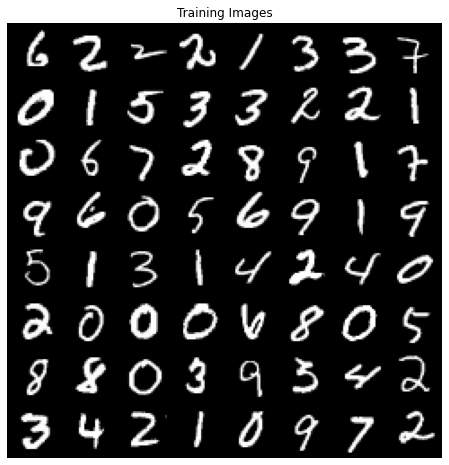

In [28]:
batch_size = 128 #batch size for dataloader
image_size = 28 # image size desired
# Number of workers for dataloader
workers = 4
train_loader = torch.utils.data.DataLoader(
 torchvision.datasets.MNIST('./', train=True, download=True,
                             transform=transforms.Compose([
                                transforms.Resize(image_size),
                                transforms.CenterCrop(image_size),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])),
  batch_size=batch_size, shuffle=True, num_workers=workers)
# Plot some training images
real_batch = next(iter(train_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)));

Let's plot the images with their labels now, just for fun and to better understand the dataset

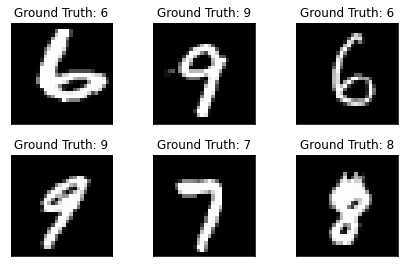

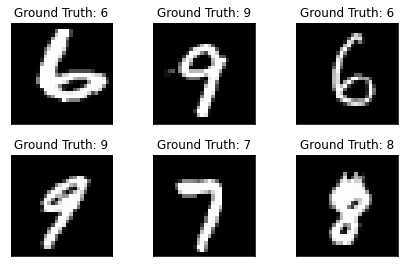

In [29]:
examples = enumerate(train_loader)
batch_idx, (example_data, example_targets) = next(examples)
fig = plt.figure()
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.tight_layout()
    plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
    plt.title("Ground Truth: {}".format(example_targets[i]))
    plt.xticks([])
    plt.yticks([])
fig

<div class="alert alert-info">
    <h2>Part 2: GANs implementation </h2>
</div>

<div class="alert alert-info">
    <h3>Part 2.1: Vanilla Gan </h3>
</div>

Creating the Generator and discriminator classes

In [30]:
class Generator(nn.Module):
    
    def __init__(self, lat_dim, nbr_gf, im_shape):
        
        super(Generator, self).__init__()
        self.lin_1 = nn.Linear(lat_dim, nbr_gf * 2)
        self.lin_2 = nn.Linear(nbr_gf * 2, nbr_gf * 4)
        self.lin_3 = nn.Linear(nbr_gf * 4, nbr_gf * 8)
        self.lin_4 = nn.Linear(nbr_gf * 8, prod(im_shape))
        self.act_1 = nn.LeakyReLU(negative_slope=0.2)
        self.act_2 = nn.Tanh()
        
    def forward(self, inp_gen, im_shape):
        
        x = self.act_1(self.lin_1(inp_gen))
        x = self.act_1(self.lin_2(x))
        x = self.act_1(self.lin_3(x))
        x = self.act_2(self.lin_4(x))
        return  x.view(x.size(0), *im_shape)

In [31]:
# Discriminator/critic class
class Discriminator(nn.Module): 
    
    def __init__(self, im_shape, nbr_df):
        
        super(Discriminator, self).__init__()
        self.lin_1 = nn.Linear(prod(im_shape), nbr_df * 8)
        self.lin_2 = nn.Linear(nbr_df * 8 , nbr_df * 4)
        self.lin_3 = nn.Linear(nbr_df * 4, nbr_df * 2)
        self.lin_4 = nn.Linear(nbr_df * 2, 1)
        self.act_1 = nn.LeakyReLU(negative_slope=0.2)
        self.act_2 = nn.Sigmoid()
        self.flt = nn.Flatten()
        
    def forward(self, x): 
        
        x = self.flt(x)
        x = self.act_1(self.lin_1(x))
        x = self.act_1(self.lin_2(x))
        x = self.act_1(self.lin_3(x))
        return  self.act_2(self.lin_4(x))

Features and hyperparameters for the GAN

In [36]:
# Size of z latent vector (i.e. size of generator input)
lat_dim = 100
# Size of feature maps in generator
nbr_gf = 64
# Size of feature maps in discriminator
nbr_df = 64
# Number of training epochs
nbr_epochs = 20
# Learning rate for optimizers
lr = 3e-4
# Beta hyperparam for Adam optimizers
beta = 0.5

The GAN class

In [37]:
class Vanilla_gan():
    
    def __init__(self, im_shape, lat_dim, nbr_gf, nbr_df, device, label='MNIST'):
                         
        self.lat_dim = lat_dim
        self.im_shape = im_shape
        self.iter_count = 0
        self.dataset_name = label
        self.model_name = 'models_'+self.dataset_name+'_gan_model.pickle'
        self.generator = Generator(lat_dim, nbr_gf, im_shape).to(device)
        self.discriminator = Discriminator(im_shape, nbr_df).to(device)
        self.device = device
        
    def train(self, dataloader, nbr_epochs, lr_rate, beta):
        
        criterion = nn.BCELoss()
        opt_d = optim.Adam(self.discriminator.parameters(), lr=lr_rate, betas=(beta, 0.999))
        opt_g = optim.Adam(self.generator.parameters(), lr=lr_rate, betas=(beta, 0.999))
        img_list, gen_loss_l, disc_loss_l, score_l, fk_score_l, fk_score_2_l = [], [], [], [], [], []
        iters = 0
        fixed_noise = torch.randn(dataloader.batch_size, self.lat_dim, device=self.device)
        real_label = 1.
        fake_label = 0.
        print("Starting Training Loop...")
        for epoch in range(nbr_epochs):
            
            for batch, _ in tqdm(dataloader):
                
                batch = batch.to(self.device)
                
                self.discriminator.zero_grad()
                trg = torch.full((batch.size(0),), real_label, dtype=torch.float, device=self.device)
                pred = self.discriminator(batch).view(-1)
                loss = criterion(pred, trg)
                score = pred.mean().item()
      
                fk_smpl = self.generator(torch.randn(batch.size(0), self.lat_dim, device=self.device), self.im_shape).detach()
                trg = torch.full((batch.size(0),), fake_label, dtype=torch.float, device=self.device)
                pred = self.discriminator(fk_smpl).view(-1)
                fk_loss = criterion(pred, trg)
                fk_score = pred.mean().item()
                disc_loss = loss + fk_loss
                disc_loss.backward()
                opt_d.step()
                
                
                self.generator.zero_grad()
                trg.fill_(real_label) 
                fk_smpl = self.generator(torch.randn(batch.size(0), self.lat_dim, device=self.device), self.im_shape)
                pred = self.discriminator(fk_smpl).view(-1)
                gen_loss = criterion(pred, trg)
                gen_loss.backward()
                fk_score_2 = pred.mean().item()
                opt_g.step()
                
                # Check how the generator is doing by saving G's output on fixed_noise
                if (iters % 500 == 0) :
                    with torch.no_grad():
                        fk_img = self.generator(fixed_noise, self.im_shape).detach().cpu()
                    img_list.append(vutils.make_grid(fk_img, padding=2, normalize=True))

                iters += 1

            print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, score: {:.4f}, fk_score: {:.4f}, fk_score_2: {:.4f}".format(
                epoch+1, nbr_epochs, gen_loss, disc_loss, score, fk_score, fk_score_2))

            # Save Losses for plotting later
            gen_loss_l.append(gen_loss)
            disc_loss_l.append(disc_loss)
            score_l.append(score)
            fk_score_l.append(fk_score)
            fk_score_2_l.append(fk_score_2)
        return img_list, gen_loss_l, disc_loss_l, score_l, fk_score_l, fk_score_2_l

In [38]:
gan = Vanilla_gan(next(examples)[1][0].shape[1:], lat_dim, nbr_gf, nbr_df, device)
img_list, gen_loss_l, disc_loss_l, score_l, fk_score_l, fk_score_2_l = gan.train(train_loader, nbr_epochs, lr, beta)

  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Starting Training Loop...


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [1/20], loss_g: 3.4646, loss_d: 0.3585, score: 0.9369, fk_score: 0.2459, fk_score_2: 0.0317


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [2/20], loss_g: 2.5127, loss_d: 0.4458, score: 0.8921, fk_score: 0.2446, fk_score_2: 0.0881


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [3/20], loss_g: 4.1274, loss_d: 0.7189, score: 0.8321, fk_score: 0.3542, fk_score_2: 0.0252


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [4/20], loss_g: 4.0981, loss_d: 0.7379, score: 0.9599, fk_score: 0.4566, fk_score_2: 0.0195


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [5/20], loss_g: 3.0951, loss_d: 0.4278, score: 0.8824, fk_score: 0.2143, fk_score_2: 0.0556


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [6/20], loss_g: 2.5625, loss_d: 0.2605, score: 0.9123, fk_score: 0.1159, fk_score_2: 0.1035


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [7/20], loss_g: 3.9440, loss_d: 0.5316, score: 0.9496, fk_score: 0.3286, fk_score_2: 0.0228


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [8/20], loss_g: 2.6832, loss_d: 0.4057, score: 0.9127, fk_score: 0.2213, fk_score_2: 0.0810


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [9/20], loss_g: 3.3530, loss_d: 0.4739, score: 0.9104, fk_score: 0.2491, fk_score_2: 0.0396


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [10/20], loss_g: 2.1787, loss_d: 0.4334, score: 0.8291, fk_score: 0.1324, fk_score_2: 0.1405


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [11/20], loss_g: 2.9119, loss_d: 0.7166, score: 0.9114, fk_score: 0.3746, fk_score_2: 0.0634


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [12/20], loss_g: 1.8080, loss_d: 0.7769, score: 0.7361, fk_score: 0.2682, fk_score_2: 0.2165


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [13/20], loss_g: 2.4236, loss_d: 0.7484, score: 0.7813, fk_score: 0.2448, fk_score_2: 0.1090


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [14/20], loss_g: 1.8498, loss_d: 0.7133, score: 0.7823, fk_score: 0.2615, fk_score_2: 0.1958


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [15/20], loss_g: 1.8135, loss_d: 0.7113, score: 0.7655, fk_score: 0.2529, fk_score_2: 0.1852


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [16/20], loss_g: 1.0347, loss_d: 0.8845, score: 0.6058, fk_score: 0.1526, fk_score_2: 0.4038


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [17/20], loss_g: 2.0026, loss_d: 0.7968, score: 0.7139, fk_score: 0.2004, fk_score_2: 0.1668


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [18/20], loss_g: 2.0130, loss_d: 0.7574, score: 0.8038, fk_score: 0.3139, fk_score_2: 0.1616


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [19/20], loss_g: 2.1496, loss_d: 0.7665, score: 0.7985, fk_score: 0.2981, fk_score_2: 0.1410


100%|████████████████████████████████████████████████████████████████████████████████| 469/469 [00:05<00:00, 80.50it/s]

Epoch [20/20], loss_g: 1.8438, loss_d: 0.6501, score: 0.7887, fk_score: 0.2322, fk_score_2: 0.2020


Let's observe how the generated images change through time

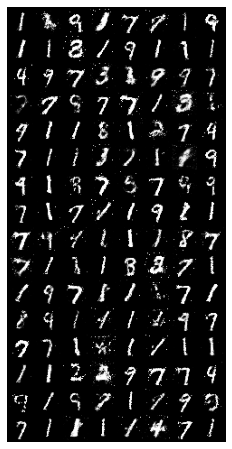

In [39]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

Now, let's compared the final generated images to the real ones.

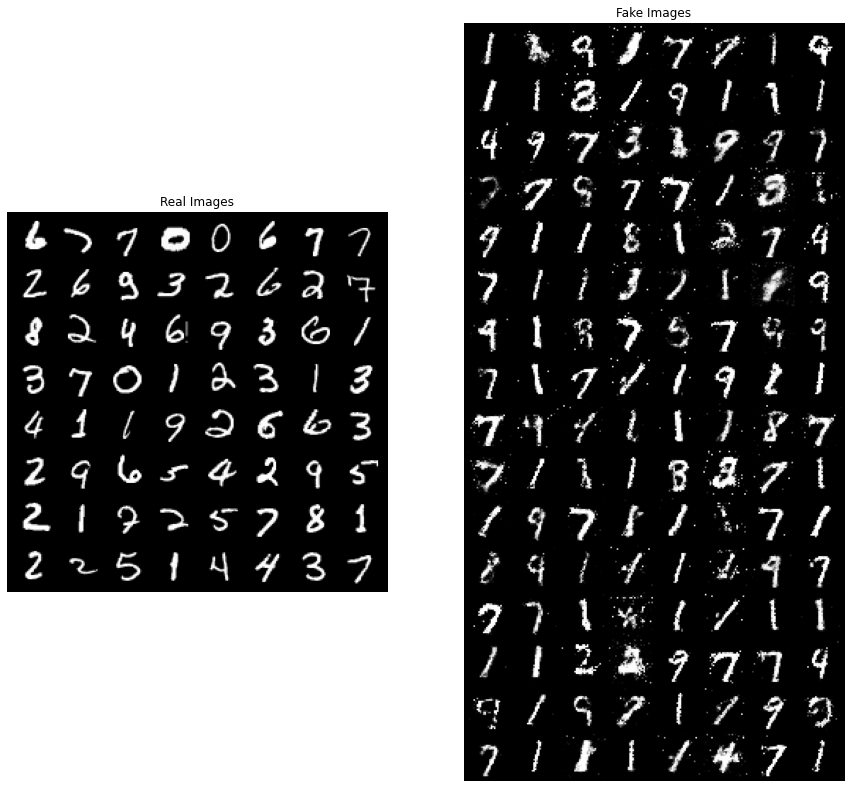

In [40]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

The generated images resembles the data but they are noisy and some of them don't even correspond to a number. We also notice that a lot of artifacts are present.

Let's do some  fancy plots

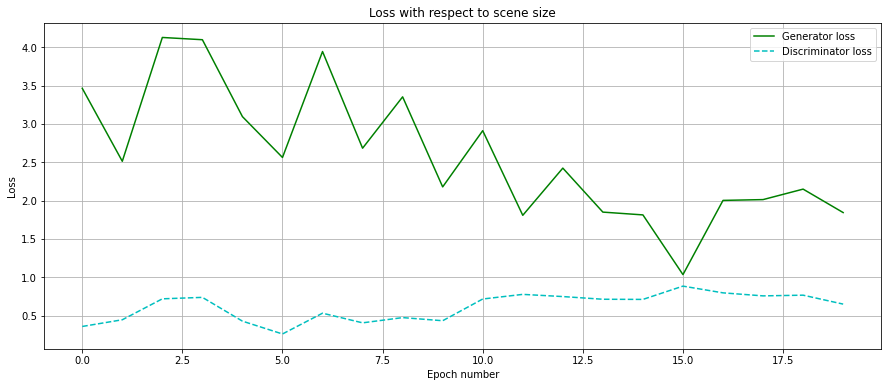

In [67]:
plt.figure(figsize=(15,6))
plt.plot(np.arange(nbr_epochs), gen_loss_l, '-g', label='Generator loss')  # solid green
plt.plot(np.arange(nbr_epochs), disc_loss_l, '--c', label='Discriminator loss') # dashed cyan
plt.grid()
plt.legend(loc="upper right")
plt.title('Loss with respect to scene size');
plt.xlabel('Epoch number')
plt.ylabel('Loss');

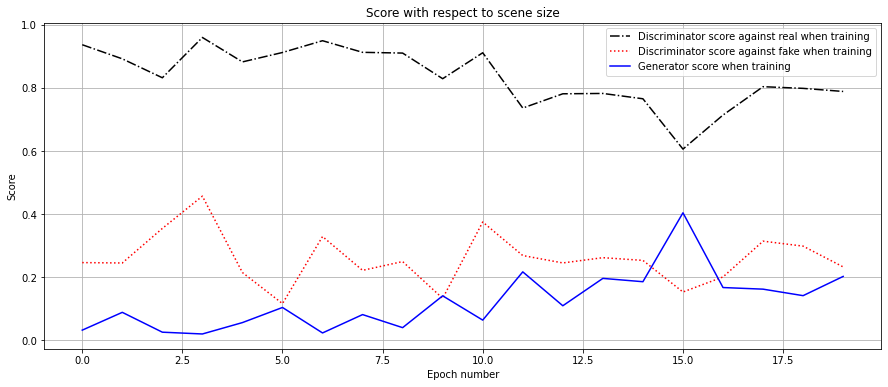

In [73]:
plt.figure(figsize=(15,6))
plt.plot(np.arange(nbr_epochs), score_l, '-.k', label='Discriminator score against real when training') # dashdot black
plt.plot(np.arange(nbr_epochs), fk_score_l, ':r', label='Discriminator score against fake when training');  # dotted red
plt.plot(np.arange(nbr_epochs), fk_score_2_l, '-b', label='Generator score when training')  # solid green
plt.grid()
plt.legend(loc="upper right")
plt.title('Score with respect to scene size');
plt.xlabel('Epoch number')
plt.ylabel('Score');

<div class="alert alert-info">
    <h3>Part 2.2 : DCGAN </h3>
</div>

Let's again create a generator and a discriminator classes but with a convulotional architecture this time

In [44]:
class DCGenerator(nn.Module):
    def __init__(self, lat_dim, nbr_gf):
        
        super(DCGenerator, self).__init__()
        self.conv_1 = nn.ConvTranspose2d(lat_dim, nbr_gf * 8, 4, 1, 0, bias=False)
        self.norm_1 = nn.BatchNorm2d(nbr_gf * 8)
        self.conv_2 = nn.ConvTranspose2d(nbr_gf * 8, nbr_gf * 4, 4, 2, 1, bias=False)
        self.norm_2 = nn.BatchNorm2d(nbr_gf * 4)
        self.conv_3 = nn.ConvTranspose2d(nbr_gf * 4, nbr_gf * 2, 4, 2, 1, bias=False)
        self.norm_3 = nn.BatchNorm2d(nbr_gf * 2)
        self.conv_4 = nn.ConvTranspose2d(nbr_gf * 2, nbr_gf, 4, 2, 1, bias=False)
        self.norm_4 = nn.BatchNorm2d(nbr_gf)
        self.conv_5 = nn.ConvTranspose2d(nbr_gf, 1, 4, 2, 1, bias=False)
        self.act_1 = nn.ReLU()
        self.act_2 = nn.Tanh()
        
    def forward(self, inp_gen):
        
        x = self.act_1(self.norm_1(self.conv_1(inp_gen)))
        x = self.act_1(self.norm_2(self.conv_2(x)))
        x = self.act_1(self.norm_3(self.conv_3(x)))
        x = self.act_1(self.norm_4(self.conv_4(x)))
        return self.act_2(self.conv_5(x))

In [45]:
class DCDiscriminator(nn.Module):
    
    def __init__(self, nbr_df):
        
        super(DCDiscriminator, self).__init__()
        self.conv_1 = nn.Conv2d(1, nbr_df, 4, 2, 1, bias=False)
        self.conv_2 = nn.Conv2d(nbr_df, nbr_df * 2, 4, 2, 1, bias=False)
        self.conv_3 = nn.Conv2d(nbr_df * 2, nbr_df * 4, 4, 2, 1, bias=False)
        self.conv_4 = nn.Conv2d(nbr_df * 4, nbr_df * 8, 4, 2, 1, bias=False)
        self.conv_5 = nn.Conv2d(nbr_df * 8, 1, 4, 1, 0, bias=False)
        self.norm_2 = nn.BatchNorm2d(nbr_df * 2)
        self.norm_3 = nn.BatchNorm2d(nbr_df * 4)
        self.norm_4 = nn.BatchNorm2d(nbr_df * 8)
        self.act_1 = nn.LeakyReLU(negative_slope=0.2)
        self.act_2 = nn.Sigmoid()
        
    def forward(self, x):
        x = self.act_1(self.conv_1(x))
        x = self.act_1(self.norm_2(self.conv_2(x)))
        x = self.act_1(self.norm_3(self.conv_3(x)))
        x = self.act_1(self.norm_4(self.conv_4(x)))
        return self.act_2(self.conv_5(x))
        

The authors of the DCGAN paper advise to initialise the weights of the generator and the critic in this way.

In [46]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

Some hyperparameters for the DCGAN, we change the image size to 64 just so we don't spend to much time meddling with convolutions.

In [47]:
batch_size = 128
image_size = 64
# Number of workers for dataloader
workers = 1
train_loader = torch.utils.data.DataLoader(
 torchvision.datasets.MNIST('./', train=True, download=True,
                             transform=transforms.Compose([
                                transforms.Resize(image_size),
                                transforms.CenterCrop(image_size),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])),
  batch_size=batch_size, shuffle=True, num_workers=workers)

In [48]:
# Number of channels in the training images.
nbr_ch = 1
# Size of z latent vector (i.e. size of generator input)
lat_dim = 100
# Size of feature maps in generator
nbr_gf = 64
# Size of feature maps in discriminator
nbr_df = 64
# Number of training epochs
nbr_epochs = 20
# Learning rate for optimizers
lr = 0.0002
# Beta hyperparam for Adam optimizers
beta = 0.5

In [49]:
class DCGan():
    def __init__(self, lat_dim, nbr_gf, nbr_df, device):
        
        self.lat_dim = lat_dim
        self.generator = DCGenerator(lat_dim, nbr_df).to(device)
        self.generator.apply(weights_init)
        self.discriminator = DCDiscriminator(nbr_df).to(device)
        self.discriminator.apply(weights_init)
        self.device = device
        
    def train(self, dataloader, nbr_epochs, lr_rate, beta):
        
        criterion = nn.BCELoss()
        opt_d = optim.Adam(self.discriminator.parameters(), lr=lr_rate, betas=(beta, 0.999))
        opt_g = optim.Adam(self.generator.parameters(), lr=lr_rate, betas=(beta, 0.999))
        
        img_list = []
        gen_loss_l, disc_loss_l, score_l, fk_score_l, fk_score_2_l = [], [], [], [], []
        iters = 0
        fixed_noise = torch.randn(dataloader.batch_size, self.lat_dim, 1, 1, device=self.device)
        real_label = 1.
        fake_label = 0.
        print("Starting Training Loop...")
        for epoch in range(nbr_epochs):
            
            for batch, _ in tqdm(dataloader):
                
                batch = batch.to(self.device)
                
                self.discriminator.zero_grad()
                trg = torch.full((batch.size(0),), real_label, dtype=torch.float, device=self.device)
                pred = self.discriminator(batch).view(-1)
                loss = criterion(pred, trg)
                score = pred.mean().item()
      
                fk_smpl = self.generator(torch.randn(batch.size(0), self.lat_dim, 1, 1, device=self.device)).detach()
                trg = torch.full((batch.size(0),), fake_label, dtype=torch.float, device=self.device)
                pred = self.discriminator(fk_smpl).view(-1)
                fk_loss = criterion(pred, trg)
                fk_score = pred.mean().item()
                disc_loss = loss + fk_loss
                disc_loss.backward()
                opt_d.step()
                
                
                self.generator.zero_grad()
                trg.fill_(real_label) 
                fk_smpl = self.generator(torch.randn(batch.size(0), self.lat_dim, 1, 1, device=self.device))
                pred = self.discriminator(fk_smpl).view(-1)
                gen_loss = criterion(pred, trg)
                gen_loss.backward()
                fk_score_2 = pred.mean().item()
                opt_g.step()
                
                # Check how the generator is doing by saving G's output on fixed_noise
                if (iters % 500 == 0) :
                    with torch.no_grad():
                        fk_img = self.generator(fixed_noise).detach().cpu()
                    img_list.append(vutils.make_grid(fk_img, padding=2, normalize=True))

                iters += 1

            print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, score: {:.4f}, fk_score: {:.4f}, fk_score_2: {:.4f}".format(
                epoch+1, nbr_epochs, gen_loss, disc_loss, score, fk_score, fk_score_2))

            # Save Losses for plotting later
            gen_loss_l.append(gen_loss)
            disc_loss_l.append(disc_loss)
            score_l.append(score)
            fk_score_l.append(fk_score)
            fk_score_2_l.append(fk_score_2)
        return img_list, gen_loss_l, disc_loss_l, score_l, fk_score_l, fk_score_2_l
        

In [50]:
dcgan = DCGan(lat_dim, nbr_gf, nbr_df, device)
img_list_dc, gen_loss_l_dc, disc_loss_l_dc, score_l_dc, fk_score_l_dc, fk_score_2_l_dc  = dcgan.train(train_loader, nbr_epochs, lr, beta)

  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Starting Training Loop...


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [1/20], loss_g: 3.3851, loss_d: 0.1377, score: 0.9575, fk_score: 0.0862, fk_score_2: 0.0535


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [2/20], loss_g: 3.0478, loss_d: 0.2234, score: 0.9365, fk_score: 0.1361, fk_score_2: 0.0756


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [3/20], loss_g: 3.7820, loss_d: 0.2884, score: 0.9218, fk_score: 0.1726, fk_score_2: 0.0356


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [4/20], loss_g: 3.6372, loss_d: 1.3744, score: 0.9768, fk_score: 0.6814, fk_score_2: 0.0401


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [5/20], loss_g: 2.7523, loss_d: 0.1176, score: 0.9135, fk_score: 0.0213, fk_score_2: 0.0876


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [6/20], loss_g: 2.9564, loss_d: 0.8470, score: 0.8393, fk_score: 0.4123, fk_score_2: 0.0774


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [7/20], loss_g: 3.0427, loss_d: 0.2222, score: 0.8741, fk_score: 0.0749, fk_score_2: 0.0759


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [8/20], loss_g: 3.4697, loss_d: 0.1435, score: 0.9491, fk_score: 0.0835, fk_score_2: 0.0483


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [9/20], loss_g: 4.5062, loss_d: 0.0795, score: 0.9873, fk_score: 0.0629, fk_score_2: 0.0216


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [10/20], loss_g: 3.1639, loss_d: 0.2603, score: 0.9126, fk_score: 0.1409, fk_score_2: 0.0724


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [11/20], loss_g: 3.0013, loss_d: 1.3166, score: 0.8684, fk_score: 0.6087, fk_score_2: 0.0791


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [12/20], loss_g: 1.5475, loss_d: 0.7499, score: 0.7368, fk_score: 0.3093, fk_score_2: 0.2798


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [13/20], loss_g: 4.4682, loss_d: 1.0298, score: 0.9700, fk_score: 0.5361, fk_score_2: 0.0267


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [14/20], loss_g: 2.6073, loss_d: 0.8553, score: 0.5028, fk_score: 0.0335, fk_score_2: 0.1253


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [15/20], loss_g: 2.9866, loss_d: 0.3522, score: 0.9013, fk_score: 0.1937, fk_score_2: 0.0905


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [16/20], loss_g: 2.5638, loss_d: 0.7625, score: 0.7436, fk_score: 0.2763, fk_score_2: 0.1483


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [17/20], loss_g: 4.7138, loss_d: 0.0288, score: 0.9858, fk_score: 0.0143, fk_score_2: 0.0141


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [18/20], loss_g: 2.3002, loss_d: 0.2498, score: 0.8678, fk_score: 0.0927, fk_score_2: 0.1458


  0%|                                                                                          | 0/469 [00:00<?, ?it/s]

Epoch [19/20], loss_g: 0.9660, loss_d: 2.5539, score: 0.1155, fk_score: 0.0004, fk_score_2: 0.4743


100%|████████████████████████████████████████████████████████████████████████████████| 469/469 [01:54<00:00,  4.11it/s]

Epoch [20/20], loss_g: 4.1019, loss_d: 0.1300, score: 0.9367, fk_score: 0.0566, fk_score_2: 0.0305


Let's see what the generator learned by showing the evolution of the generated images

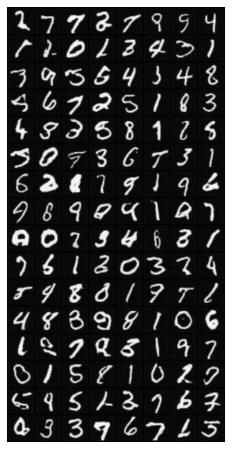

In [51]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list_dc]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

Let's now print the data next to some generated images

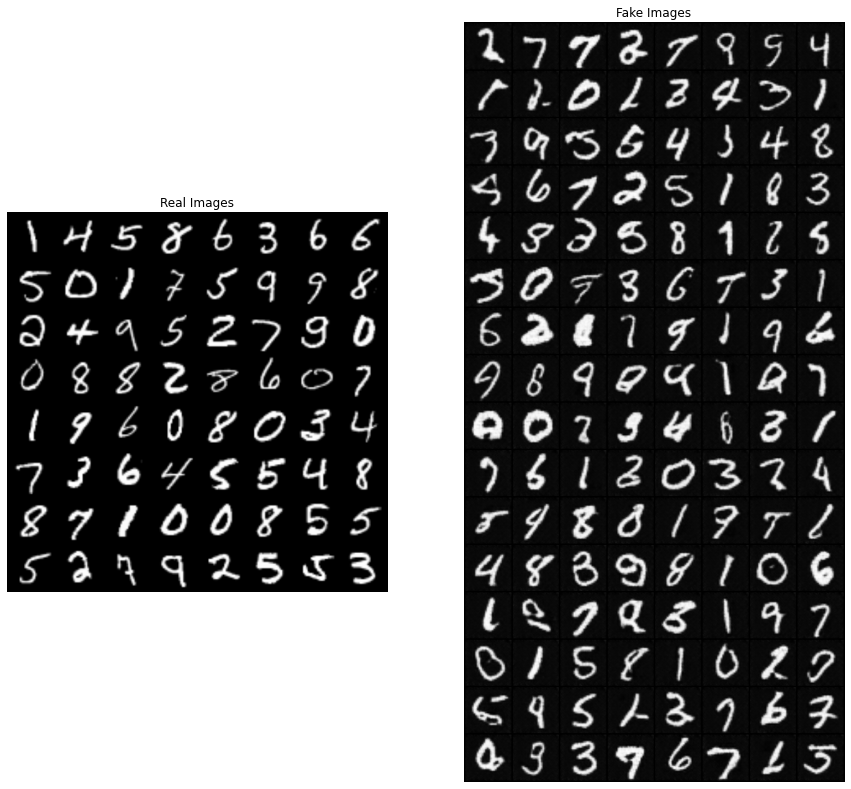

In [52]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list_dc[-1],(1,2,0)))
plt.show()

The results, visually speaking, are considerably better than those generated by the MLP one. The results are cleaner than the previous one and no noise can be seen or artifacts.

Let's do some fancy plots again, not so fancy this time.

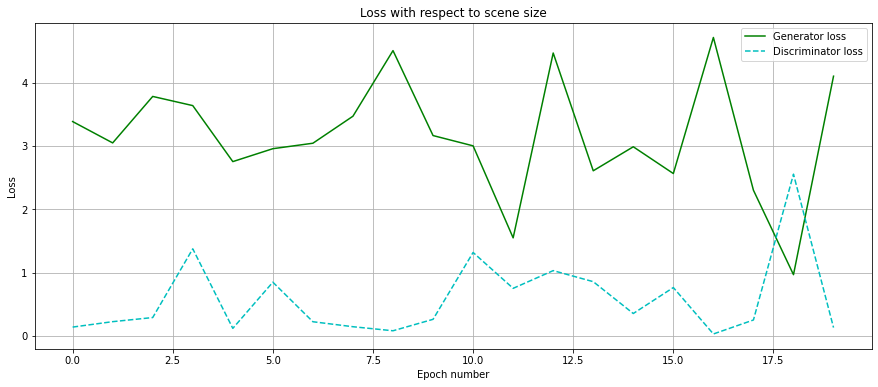

In [70]:
plt.figure(figsize=(15,6))
plt.plot(np.arange(nbr_epochs), gen_loss_l_dc, '-g', label='Generator loss')  # solid green
plt.plot(np.arange(nbr_epochs), disc_loss_l_dc, '--c', label='Discriminator loss') # dashed cyan
plt.grid()
plt.legend(loc="upper right")
plt.title('Loss with respect to scene size');
plt.xlabel('Epoch number')
plt.ylabel('Loss');

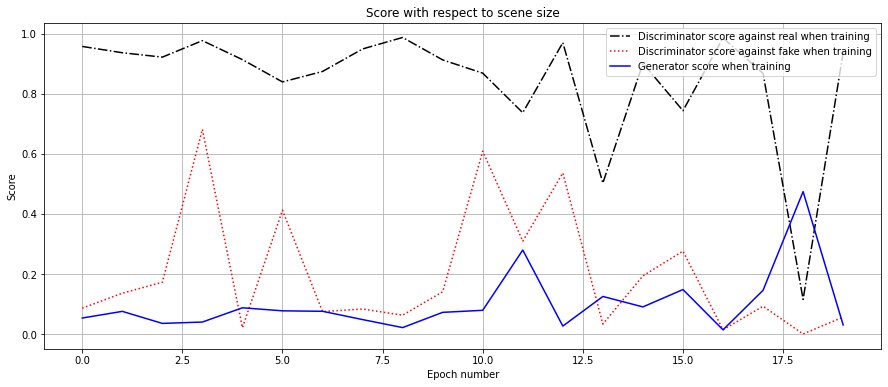

In [72]:
plt.figure(figsize=(15,6))
plt.plot(np.arange(nbr_epochs), score_l_dc, '-.k', label='Discriminator score against real when training') # dashdot black
plt.plot(np.arange(nbr_epochs), fk_score_l_dc, ':r', label='Discriminator score against fake when training');  # dotted red
plt.plot(np.arange(nbr_epochs), fk_score_2_l_dc, '-b', label='Generator score when training')  # solid green
plt.grid()
plt.legend(loc="upper right")
plt.title('Score with respect to scene size');
plt.xlabel('Epoch number')
plt.ylabel('Score');

<div class="alert alert-info">
    <h3>Part 2.3: OT-GAN </h3>
</div>

Let's implement a generator and a discriminator like described in a ppendix B of the OT-GAN paper.

In [54]:
class OTGenerator(nn.Module):
    def __init__(self, lat_dim):
        
        super(OTGenerator, self).__init__()
        self.lin = nn.Linear(lat_dim, 32768)
        self.conv_1 = nn.Conv2d(1024, 1024, 5, 1, 2)
        self.conv_2 = nn.Conv2d(512, 512, 5, 1, 2)
        self.conv_3 = nn.Conv2d(256, 256, 5, 1, 2)
        self.conv_4 = nn.Conv2d(128, 1, 5, 1, 2)
        self.upsample = nn.Upsample(scale_factor=2, mode='nearest')
        self.act = nn.Tanh()
        self.act_2 = nn.Sigmoid()
        
    def forward(self, inp_gen):
        x = self.lin(inp_gen)
        x, y = x.chunk(chunks=2, dim=1)
        x = x * self.act_2(y)
        x = x.view(x.size(0), 1024, 4, 4)
        x = self.upsample(x)
        x = self.conv_1(x)
        x, y = x.chunk(chunks=2, dim=1)
        x = x * self.act_2(y)
        x = self.upsample(x)
        x = self.conv_2(x)
        x, y = x.chunk(chunks=2, dim=1)
        x = x * self.act_2(y)
        x = self.upsample(x)
        x = self.conv_3(x)
        x, y = x.chunk(chunks=2, dim=1)
        x = x * self.act_2(y)
        x = self.act(self.conv_4(x))
        return  x

In [55]:
class OTDiscriminator(nn.Module):
    def __init__(self):
        
        super(OTDiscriminator, self).__init__()
        self.conv_1 = nn.Conv2d(1, 128, 5, 1, 2)
        self.conv_2 = nn.Conv2d(256, 256, 5, 2, 2)
        self.conv_3 = nn.Conv2d(512, 512, 5, 2, 2)
        self.conv_4 = nn.Conv2d(1024, 1024, 5, 2, 2)
        
    def forward(self, x):
        x = self.conv_1(x)
        x = torch.cat((nn.functional.relu(x), nn.functional.relu(-x)), 1)
        x = self.conv_2(x)
        x = torch.cat((nn.functional.relu(x), nn.functional.relu(-x)), 1)
        x = self.conv_3(x)
        x = torch.cat((nn.functional.relu(x), nn.functional.relu(-x)), 1)
        x = self.conv_4(x)
        x = torch.cat((nn.functional.relu(x), nn.functional.relu(-x)), 1)
        x = torch.reshape(x,  (x.size(0), 32768))
        x = nn.functional.normalize(x, p=2, dim=1)
        return x
        

In [56]:
class OTGAN():
    """OTGAN implementation as described in Salimans et al (2018)."""
    def __init__(self, lat_dim , train_ratio, device):

        self.lat_dim  = lat_dim
        self.train_ratio = train_ratio
        self.generator = OTGenerator(lat_dim).to(device)
        self.discriminator = OTDiscriminator().to(device)
        self.device = device


    def compute_cost(self, batch, batch_1):
        return 1 - (batch @ batch_1.t()) / (torch.norm(batch, p=2) * torch.norm(batch_1, p=2))

    
    
    def sinkhorn(self, a, b, C, epsilon=0.5, max_iters=100):
        """Run Sinnkhorn's algorithm"""
        u = torch.ones_like(a, device=self.device)
        with torch.no_grad():
            K = torch.exp(-C/epsilon)
            for i in range(max_iters):
                v = b / torch.matmul(K, u)
                u = a / torch.matmul(K.T, v)

        return torch.matmul(torch.diag(u), torch.matmul(K, torch.diag(v)))

        
    def train(self, dataloader, nbr_epochs, lr_rate, beta):
        
        opt_d = optim.Adam(self.discriminator.parameters(), lr=lr_rate, betas=(beta, 0.999))
        opt_g = optim.Adam(self.generator.parameters(), lr=lr_rate, betas=(beta, 0.999))
        fixed_noise = 2 * torch.rand(dataloader.batch_size, self.lat_dim, device=self.device) - 1
        iters = 0
        for epoch in range(nbr_epochs):
            
            loss_l, img_list = [], []
            
            for idx, (batch, _) in enumerate(tqdm(dataloader)):
                
                batch, batch_1 = batch.chunk(chunks=2, dim=0)
                batch = batch.to(self.device)
                batch_1 = batch_1.to(self.device)
                
                self.discriminator.zero_grad()
                self.generator.zero_grad()
                
                # Generating fake samples
                fk_smpl_1 = self.generator(2 * torch.rand(batch.size(0), self.lat_dim, device=self.device) - 1)
                fk_smpl_2 = self.generator(2 * torch.rand(batch.size(0), self.lat_dim, device=self.device) - 1)
                
                # prediction on real and fake batches
                pred = self.discriminator(batch)
                pred_2 = self.discriminator(batch_1)
                fk_pred, fk_pred_2 = self.discriminator(fk_smpl_1), self.discriminator(fk_smpl_2)    
                
                
                
                # Computing costs
                cost_pred, cost_pred_fk = self.compute_cost(pred, pred_2), self.compute_cost(pred, fk_pred)
                cost_pred_2_fk, cost_pred_2_fk_2 = self.compute_cost(pred_2, fk_pred), self.compute_cost(pred_2, fk_pred_2)
                cost_pred_fk_2, cost_fk = self.compute_cost(pred, fk_pred_2), self.compute_cost(fk_pred, fk_pred_2)
                
                
                # using the sinkhorn algorithm to compute optimal matchings
                a = (torch.ones(batch.size(0)) / batch.size(0)).to(self.device)
                b = (torch.ones(batch.size(0)) / batch.size(0)).to(self.device)
                
                match_pred, match_pred_fk = self.sinkhorn(a, b, cost_pred), self.sinkhorn(a, b, cost_pred_fk)
                match_pred_fk_2, match_pred_2_fk = self.sinkhorn(a, b, cost_pred_fk_2), self.sinkhorn(a, b, cost_pred_2_fk_2)
                match_pred_2_fk_2, match_fk = self.sinkhorn(a, b, cost_pred_2_fk_2), self.sinkhorn(a, b, cost_fk)

                # Compute loss
                
                loss_pred = torch.sum(match_pred * cost_pred)
                loss_pred_fk = torch.sum(match_pred_fk * cost_pred_fk)
                loss_pred_fk_2 = torch.sum(match_pred_fk_2 * cost_pred_fk_2)
                loss_pred_2_fk = torch.sum(match_pred_2_fk * cost_pred_2_fk)
                loss_pred_2_fk_2 = torch.sum(match_pred_2_fk_2 * cost_pred_2_fk_2)
                loss_fk = torch.sum(match_fk * cost_fk) 
                loss = loss_pred_fk + loss_pred_fk_2 + loss_pred_2_fk + loss_pred_2_fk_2 - 2 * (loss_pred_fk_2 + loss_fk)
                
                loss.backward()

                if idx+1 % self.train_ratio == 0:
                    opt_d.step()
                else :
                    opt_g.step()
                    
                # Check how the generator is doing by saving G's output on fixed_noise
                if (iters % 500 == 0) :
                    with torch.no_grad():
                        fk_img = self.generator(fixed_noise).detach().cpu()
                    img_list.append(vutils.make_grid(fk_img, padding=2, normalize=True))
                iters+=1
        
            print("Epoch [{}/{}], loss: {:.4f}".format(epoch+1, nbr_epochs, loss))
        
            # Save Losses for plotting later
            loss_l.append(loss)
        return img_list, loss_l

In [59]:
batch_size = 64
image_size = 32
# Number of workers for dataloader
workers = 1
train_loader = torch.utils.data.DataLoader(
 torchvision.datasets.MNIST('./', train=True, download=True,
                             transform=transforms.Compose([
                                transforms.Resize(image_size),
                                transforms.CenterCrop(image_size),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])),
  batch_size=batch_size, shuffle=True, num_workers=workers)

# Size of z latent vector (i.e. size of generator input)
lat_dim = 100
# Number of training epochs
nbr_epochs = 20
# Learning rate for optimizers
lr = 3e-4
# Beta hyperparam for Adam optimizers
beta = 0.5
# 
train_ratio = 3

In [62]:
torch.cuda.empty_cache()

In [63]:
otgan = OTGAN(lat_dim, train_ratio, device)
img_list_ot, loss_ot = otgan.train(train_loader, nbr_epochs, lr, beta)

  0%|                                                                                          | 0/938 [00:01<?, ?it/s]


RuntimeError: CUDA out of memory. Tried to allocate 20.00 MiB (GPU 0; 6.00 GiB total capacity; 4.41 GiB already allocated; 0 bytes free; 4.43 GiB reserved in total by PyTorch)

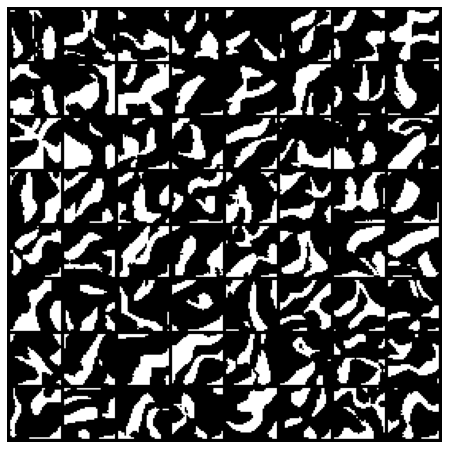

In [24]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

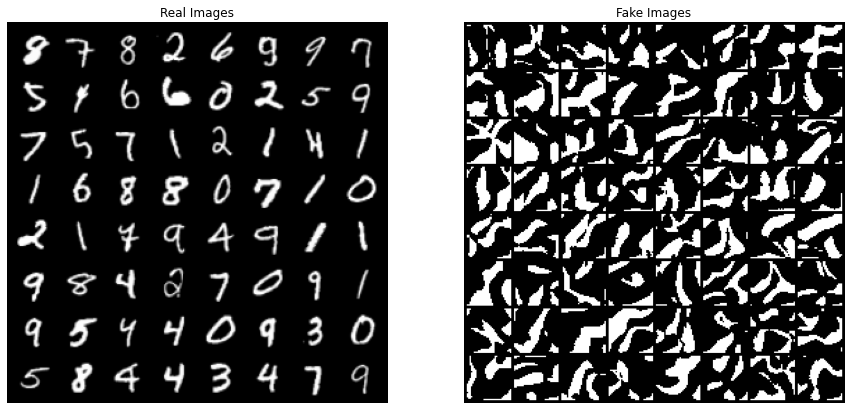

In [25]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()